In [1]:
%matplotlib inline
# -*- coding: utf-8 -*-
"""
Created on Fri Apr 22 17:25:13 2016

@author: tabacof
"""

# Implements a variational autoencoder as described in Kingma et al. 2013
# "Auto-Encoding Variational Bayes"
import theano
theano.config.floatX = 'float32'
import theano.tensor as T
import numpy as np
import lasagne
from parmesan.distributions import log_normal2, kl_normal2_stdnormal
from parmesan.layers import SimpleSampleLayer
import time, shutil, os
import scipy
from scipy.io import loadmat
import matplotlib
import pylab as plt
from read_write_model import read_model, write_model

Using gpu device 0: GeForce GTX 1070 (CNMeM is enabled with initial size: 80.0% of memory, cuDNN 5105)


In [2]:
#settings
do_train_model = False
batch_size = 100
latent_size = 100
lr = 0.0002
num_epochs = 25
model_filename = "svhn_conv_ae"
nplots = 5

np.random.seed(1234) # reproducibility

In [3]:
#SYMBOLIC VARS
sym_x = T.tensor4()
sym_lr = T.scalar('lr')

### LOAD DATA
print "Using SVHN dataset"

svhn_train = loadmat('train_32x32.mat')
svhn_test = loadmat('test_32x32.mat')

train_x = np.rollaxis(svhn_train['X'], 3).transpose(0,3,1,2).astype(theano.config.floatX)
test_x = np.rollaxis(svhn_test['X'], 3).transpose(0,3,1,2).astype(theano.config.floatX)

train_y = svhn_train['y'].flatten() - 1
test_y = svhn_test['y'].flatten() - 1

svhn_mean = 115.11177966923525
svhn_std = 50.819267906232888
train_x = (train_x - svhn_mean)/svhn_std
test_x = (test_x - svhn_mean)/svhn_std

n_train_batches = train_x.shape[0] / batch_size
n_test_batches = test_x.shape[0] / batch_size

#setup shared variables
sh_x_train = theano.shared(train_x, borrow=True)
sh_x_test = theano.shared(test_x, borrow=True)

Using SVHN dataset


In [4]:
### RECOGNITION MODEL q(z|x)
l_in = lasagne.layers.InputLayer((batch_size, 3, 32, 32))
l_noise = lasagne.layers.BiasLayer(l_in, b = np.zeros((3,32,32), dtype = np.float32), shared_axes = 0, name = "NOISE")
l_noise.params[l_noise.b].remove("trainable")
l_enc_h1 = lasagne.layers.Conv2DLayer(l_noise, num_filters = 32, filter_size = 4, stride = 2, nonlinearity = lasagne.nonlinearities.elu, name = 'ENC_CONV1')
l_enc_h1 = lasagne.layers.Conv2DLayer(l_enc_h1, num_filters = 64, filter_size = 4, stride = 2, nonlinearity = lasagne.nonlinearities.elu, name = 'ENC_CONV2')
l_enc_h1 = lasagne.layers.Conv2DLayer(l_enc_h1, num_filters = 128, filter_size = 4, stride = 2, nonlinearity = lasagne.nonlinearities.elu, name = 'ENC_CONV3')
l_enc_h1 = lasagne.layers.DenseLayer(l_enc_h1, num_units=512, nonlinearity=lasagne.nonlinearities.elu, name='ENC_DENSE2')

l_z = lasagne.layers.DenseLayer(l_enc_h1, num_units=latent_size, nonlinearity=lasagne.nonlinearities.identity, name='Z')

In [5]:
### GENERATIVE MODEL p(x|z)
l_dec_h1 = lasagne.layers.DenseLayer(l_z, num_units=512, nonlinearity=lasagne.nonlinearities.elu, name='DEC_DENSE1')
l_dec_h1 = lasagne.layers.ReshapeLayer(l_dec_h1, (batch_size, -1, 4, 4))
l_dec_h1 = lasagne.layers.TransposedConv2DLayer(l_dec_h1, num_filters = 128, crop="same",filter_size = 5, stride = 2, nonlinearity = lasagne.nonlinearities.elu, name = 'DEC_CONV1')
l_dec_h1 = lasagne.layers.TransposedConv2DLayer(l_dec_h1, num_filters = 64, crop="same",filter_size = 5, stride = 2, nonlinearity = lasagne.nonlinearities.elu, name = 'DEC_CONV2')
l_dec_h1 = lasagne.layers.TransposedConv2DLayer(l_dec_h1, num_filters = 32, filter_size = 5, stride = 2, nonlinearity = lasagne.nonlinearities.elu, name = 'DEC_CONV3')
l_dec_x = lasagne.layers.TransposedConv2DLayer(l_dec_h1, num_filters = 3,filter_size = 4, nonlinearity = lasagne.nonlinearities.identity, name = 'DEC_MU')
l_dec_x = lasagne.layers.ReshapeLayer(l_dec_x, (batch_size, -1))

# Get outputs from model
dec_x = lasagne.layers.get_output(l_dec_x, sym_x, deterministic=False)

In [6]:
loss = lasagne.objectives.squared_error(dec_x, sym_x.reshape((batch_size, -1)))
loss = lasagne.objectives.aggregate(loss, mode="mean")

params = lasagne.layers.get_all_params(l_dec_x, trainable=True)
for p in params:
    print p, p.get_value().shape

### Take gradient of Negative LogLikelihood
grads = T.grad(loss, params)

# Add gradclipping to reduce the effects of exploding gradients.
# This speeds up convergence
clip_grad = 1
max_norm = 5
mgrads = lasagne.updates.total_norm_constraint(grads,max_norm=max_norm)
cgrads = [T.clip(g,-clip_grad, clip_grad) for g in mgrads]

ENC_CONV1.W (32, 3, 4, 4)
ENC_CONV1.b (32,)
ENC_CONV2.W (64, 32, 4, 4)
ENC_CONV2.b (64,)
ENC_CONV3.W (128, 64, 4, 4)
ENC_CONV3.b (128,)
ENC_DENSE2.W (512, 512)
ENC_DENSE2.b (512,)
Z.W (512, 100)
Z.b (100,)
DEC_DENSE1.W (100, 512)
DEC_DENSE1.b (512,)
DEC_CONV1.W (32, 128, 5, 5)
DEC_CONV1.b (128,)
DEC_CONV2.W (128, 64, 5, 5)
DEC_CONV2.b (64,)
DEC_CONV3.W (64, 32, 5, 5)
DEC_CONV3.b (32,)
DEC_MU.W (32, 3, 4, 4)
DEC_MU.b (3,)


In [7]:
#Setup the theano functions
sym_batch_index = T.iscalar('index')
batch_slice = slice(sym_batch_index * batch_size, (sym_batch_index + 1) * batch_size)

updates = lasagne.updates.adam(cgrads, params, learning_rate=sym_lr)

train_model = theano.function([sym_batch_index, sym_lr], loss, updates=updates,
                                  givens={sym_x: sh_x_train[batch_slice]},)

test_model = theano.function([sym_batch_index], loss,
                                  givens={sym_x: sh_x_test[batch_slice]},)

plot_results = theano.function([sym_batch_index], dec_x,
                                  givens={sym_x: sh_x_test[batch_slice]},)

def train_epoch(lr):
    costs = []
    for i in range(n_train_batches):
        cost_batch = train_model(i, lr)
        costs += [cost_batch]
    return np.mean(costs)


def test_epoch():
    costs = []
    for i in range(n_test_batches):
        cost_batch = test_model(i)
        costs += [cost_batch]
    return np.mean(costs)

In [8]:
if do_train_model:
    # Training Loop
    for epoch in range(num_epochs):
        start = time.time()

        #shuffle train data, train model and test model
        np.random.shuffle(train_x)
        sh_x_train.set_value(train_x)
        
        results = plot_results(0)
        plt.figure(figsize=(2, nplots))
        for i in range(0,nplots):
            plt.subplot(nplots,2,(i+1)*2-1)
            plt.imshow((svhn_std*test_x[i].transpose(1,2,0)+svhn_mean)/255.0)
            plt.axis('off')
            plt.subplot(nplots,2,(i+1)*2)
            plt.imshow((svhn_std*results[i].reshape(3,32,32).transpose(1,2,0)+svhn_mean)/255.0)
            plt.axis('off')
        plt.show()
            
        train_cost = train_epoch(lr)
        test_cost = test_epoch()

        t = time.time() - start

        line =  "*Epoch: %i\tTime: %0.2f\tLR: %0.5f\tLL Train: %0.3f\tLL test: %0.3f\t" % ( epoch, t, lr, train_cost, test_cost)
        print line
    
    print "Write model data"
    write_model(l_dec_x, model_filename)
else:
    read_model(l_dec_x, model_filename)
    

In [9]:
l_z, reconstruction = lasagne.layers.get_output([l_z, l_dec_x], inputs = sym_x, deterministic=True)
# Adversarial confusion cost function
    
# Mean squared reconstruction difference
# KL divergence between latent variables
adv_z =  T.vector()
adv_confusion = lasagne.objectives.squared_error(adv_z, l_z).sum()

# Adversarial regularization
C = T.scalar()
adv_reg = C*lasagne.regularization.l2(l_noise.b)
# Total adversarial loss
adv_loss = adv_confusion + adv_reg
adv_grad = T.grad(adv_loss, l_noise.b)

# Function used to optimize the adversarial noise
adv_function = theano.function([sym_x, adv_z, C], [adv_loss, adv_grad])

# Helper to plot reconstructions    
adv_plot = theano.function([sym_x], reconstruction)

# Function to get latent variables of the target
adv_l_z = theano.function([sym_x], l_z)

In [10]:
def show_svhn(img, i, title=""): # expects flattened image of shape (3072,) 
    img = img.copy().reshape(3,32,32).transpose(1,2,0)
    img *= svhn_std
    img += svhn_mean
    img /= 255.0
    img = np.clip(img, 0, 1)
    plt.subplot(3, 2, i)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")
    
def svhn_input(img):
    return np.tile(img, (batch_size, 1, 1, 1)).reshape(batch_size, 3, 32, 32)

def svhn_dist(img1, img2):
    img1_pixels = img1.flatten()*svhn_std + svhn_mean
    img2_pixels = img2.flatten()*svhn_std + svhn_mean
    return np.linalg.norm(img1_pixels - img2_pixels)

In [11]:
def adv_test(orig_img = 0, target_img = 1, C = 200.0, plot = True):
    # Set the adversarial noise to zero
    l_noise.b.set_value(np.zeros((3,32,32)).astype(np.float32))
    
    # Get latent variables of the target
    adv_target_z = adv_l_z(svhn_input(test_x[target_img]))
    adv_target_z = adv_target_z[0]

    original_reconstruction = adv_plot(svhn_input(test_x[orig_img]))[0]
    target_reconstruction = adv_plot(svhn_input(test_x[target_img]))[0]

    orig_reconstruction_dist = svhn_dist(original_reconstruction, test_x[orig_img])
    target_reconstruction_dist = svhn_dist(target_reconstruction, test_x[target_img])
    
    # Plot original reconstruction    
    if plot:
        plt.figure(figsize=(10,10))
        show_svhn(test_x[orig_img], 1, "Original image")
        show_svhn(original_reconstruction, 2, "Original reconstruction")

    # Initialize the adversarial noise for the optimization procedure
    l_noise.b.set_value(np.random.uniform(-1e-8, 1e-8, size=(3,32,32)).astype(np.float32))
    
    # Optimization function for L-BFGS-B
    def fmin_func(x):
        l_noise.b.set_value(x.reshape(3, 32, 32).astype(np.float32))
        f, g = adv_function(svhn_input(test_x[orig_img]), adv_target_z, C)
        return float(f), g.flatten().astype(np.float64)
        
    # Noise bounds (pixels cannot exceed 0-1)
    bounds = zip(-svhn_mean/svhn_std-test_x[orig_img].flatten(), (255.0-svhn_mean)/svhn_std-test_x[orig_img].flatten())
    
    # L-BFGS-B optimization to find adversarial noise
    x, f, d = scipy.optimize.fmin_l_bfgs_b(fmin_func, l_noise.b.get_value().flatten(), bounds = bounds, fprime = None, factr = 10, m = 25)
    
    adv_img = adv_plot(svhn_input(test_x[orig_img]))[0]
    
    orig_dist = svhn_dist(adv_img, test_x[orig_img])
    adv_dist = svhn_dist(adv_img, test_x[target_img])
    
    # Plotting results
    if plot:
        show_svhn(x, 3, "Adversarial noise")
        show_svhn(test_x[target_img], 4, "Target image")
        show_svhn((test_x[orig_img].flatten()+x), 5, "Adversarial image")
        show_svhn(adv_img, 6, "Adversarial reconstruction")
    
        plt.show()
            
    return orig_dist, adv_dist, orig_reconstruction_dist, target_reconstruction_dist
    

In [12]:
def orig_adv_dist(orig_img = None, target_img = None, plot = False):
    if orig_img is None:
        orig_img = np.random.randint(0, len(test_x))
    if target_img is None:
        target_label = test_y[orig_img]
        while target_label == test_y[orig_img]:
            target_img = np.random.randint(0, len(test_x))
            target_label = test_y[target_img]
    
    print orig_img, target_img
    
    orig_dist=[]
    adv_dist=[]

    C = np.logspace(-10, 20, 50, base = 2, dtype = np.float32)
    
    for c in C:
        od, ad, ore, tre = adv_test(orig_img, target_img, C=c, plot = False)
        orig_dist.append(od)
        adv_dist.append(ad)

    orig_dist = np.array(orig_dist)
    adv_dist = np.array(adv_dist)
    bestC = C[np.argmax(adv_dist - orig_dist >= 0)-1]

    _, _, orig_reconstruction_dist, target_reconstruction_dist = adv_test(orig_img, target_img, C=bestC, plot = plot)

    if plot:
        #plt.figure()
        #plt.plot(np.log(C), orig_dist, label = "Orig")
        #plt.plot(np.log(C), adv_dist, label = "Adv")
        #plt.ylabel("L2 norm")
        #plt.xlabel("Log regularization weight")
        #plt.legend()
        #plt.plot()

        plt.figure()
        plt.axhline(y=target_reconstruction_dist, linewidth = 2, color = 'cyan', label = "Target reconstruction - Target")
        plt.axvline(x=orig_reconstruction_dist, linewidth = 2, color='DarkOrange', label = "Original reconstruction - Original")
        plt.scatter(adv_dist, orig_dist)
        plt.ylabel("Adversarial reconstruction - Target")
        plt.xlabel("Adversarial - Original")
        plt.legend()
        plt.plot()
        
    y = (orig_dist - target_reconstruction_dist)/orig_dist[0]
    x = (adv_dist - orig_reconstruction_dist)/adv_dist[-1]
    return x, y

24184 24981


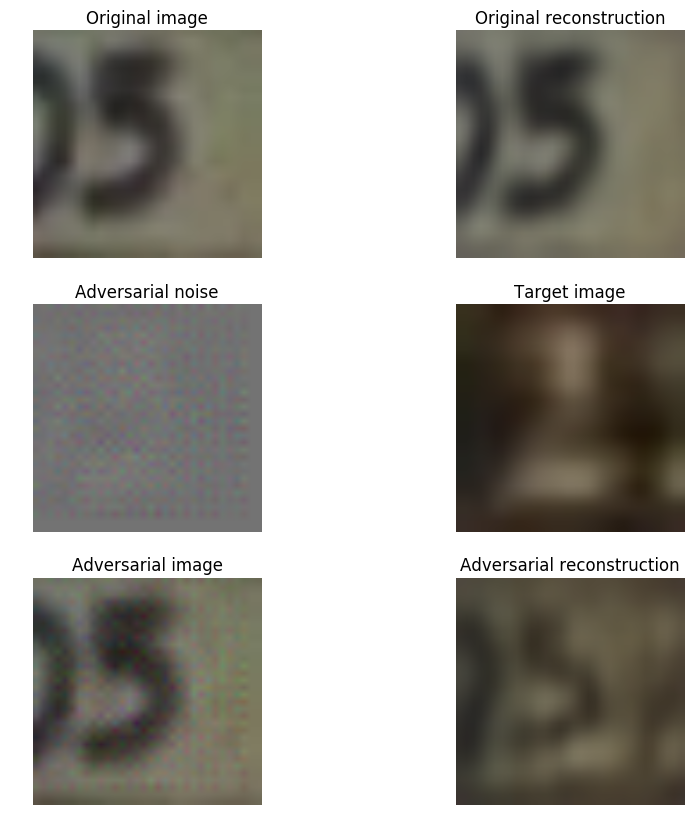

1338 9668


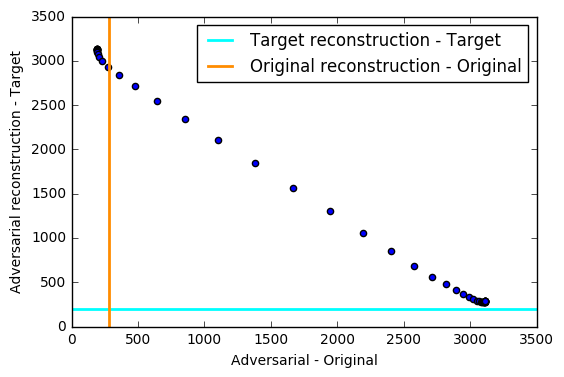

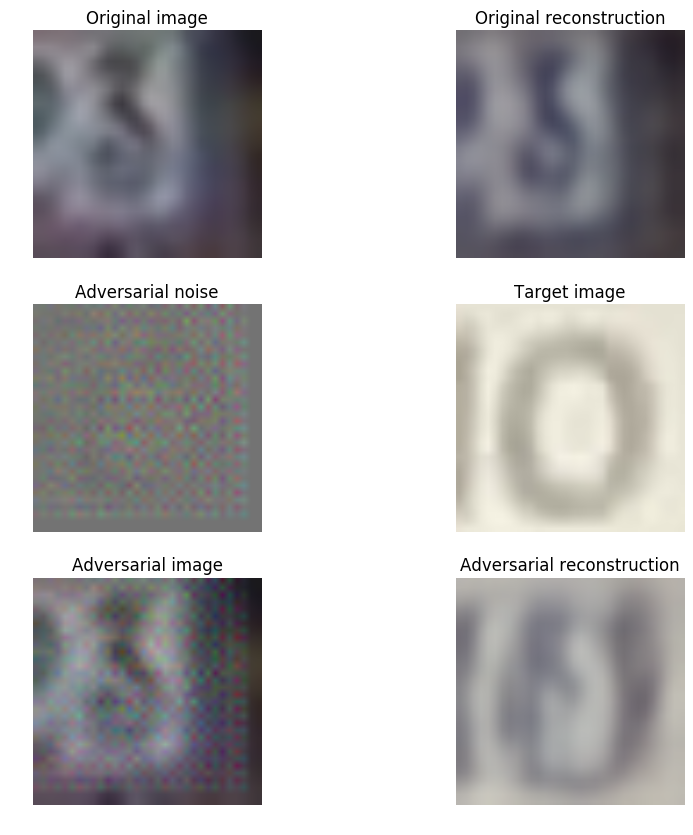

7156 20317


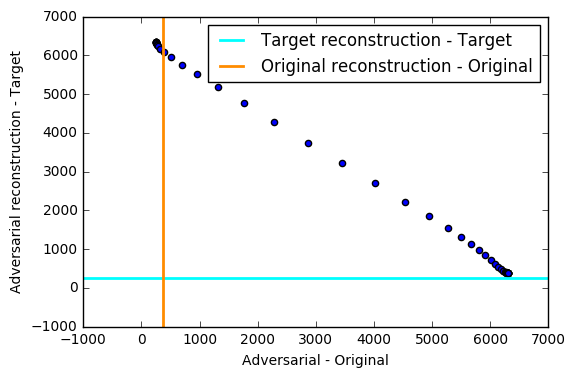

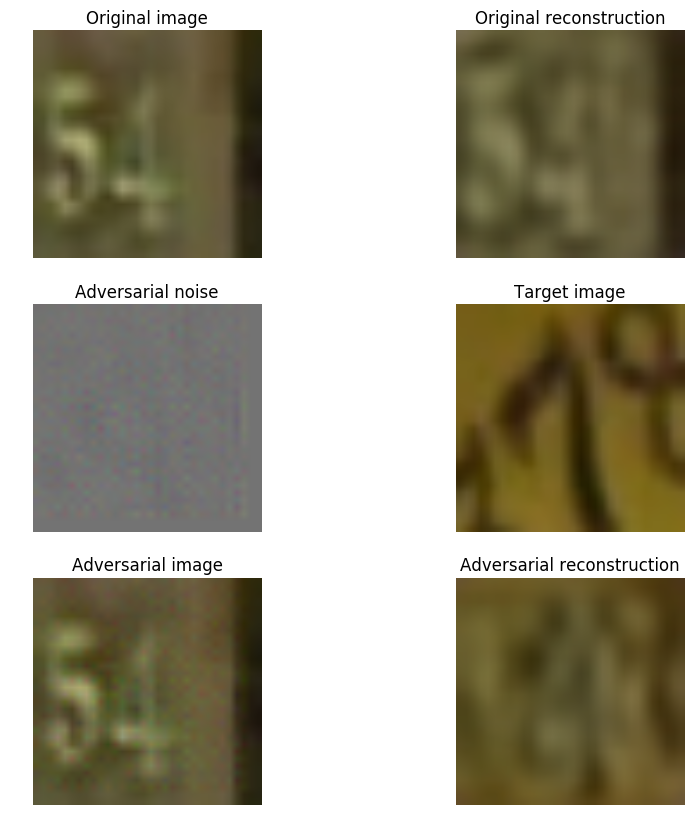

3963 8789


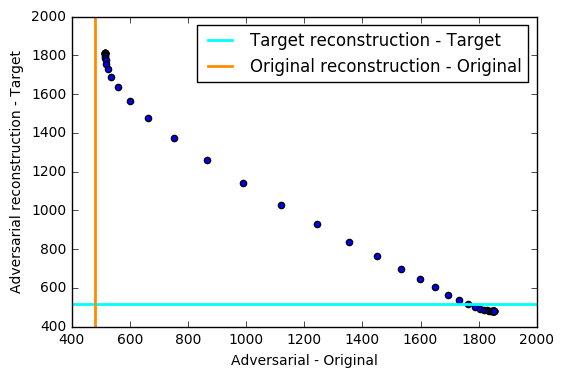

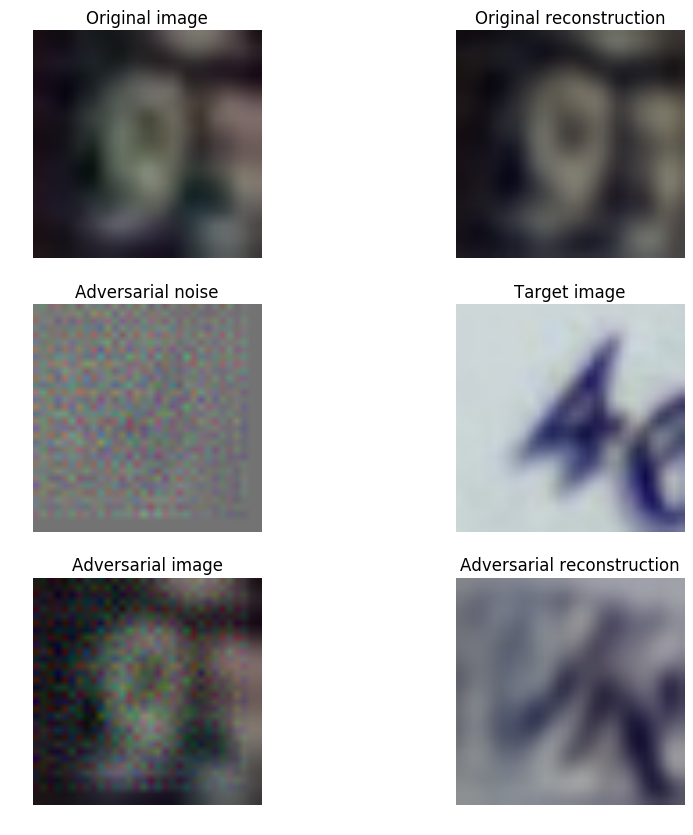

20272 5956


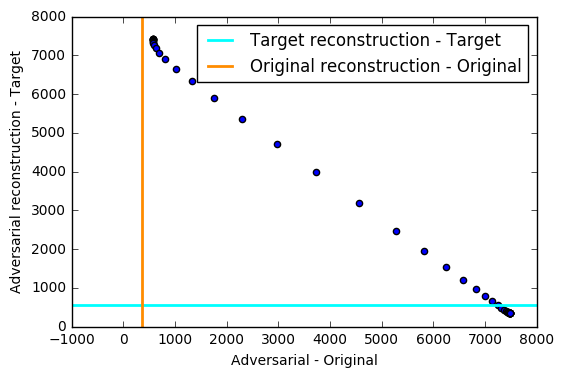

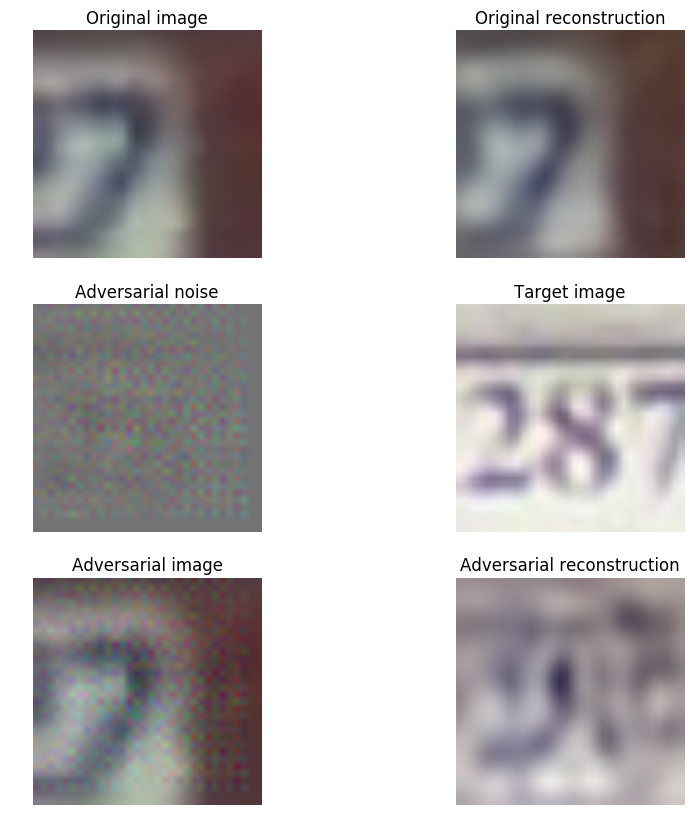

216 12261


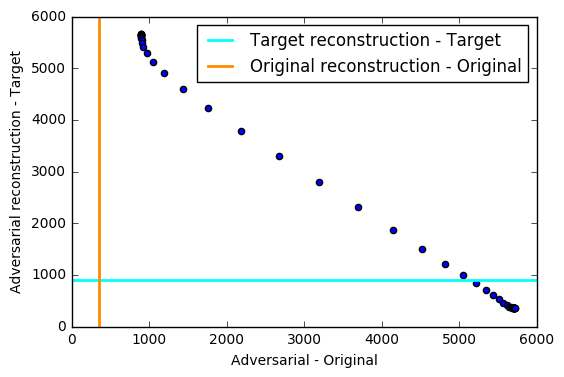

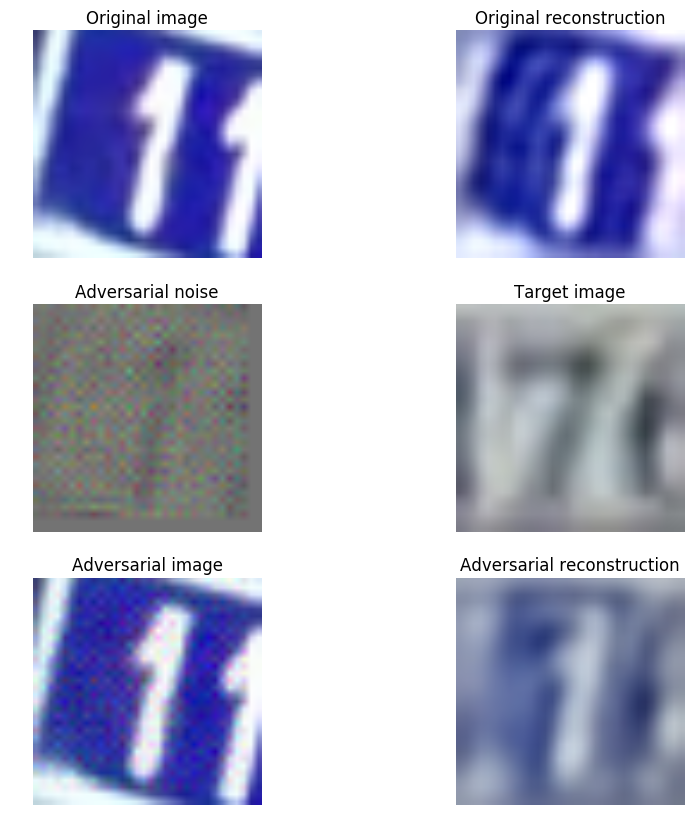

649 18829


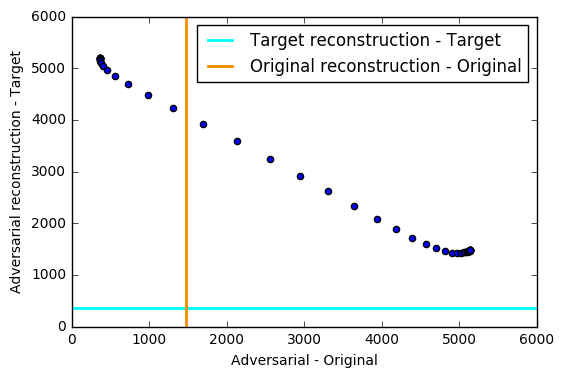

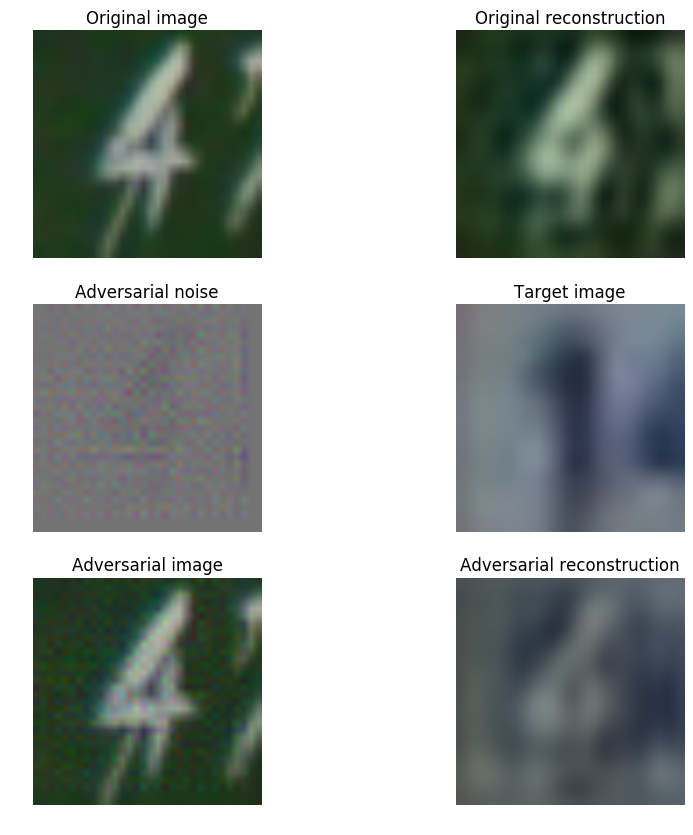

22602 20469


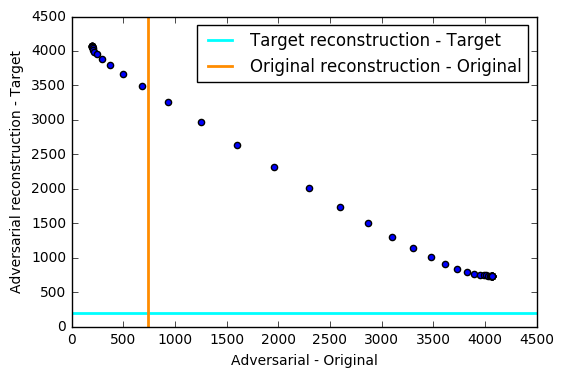

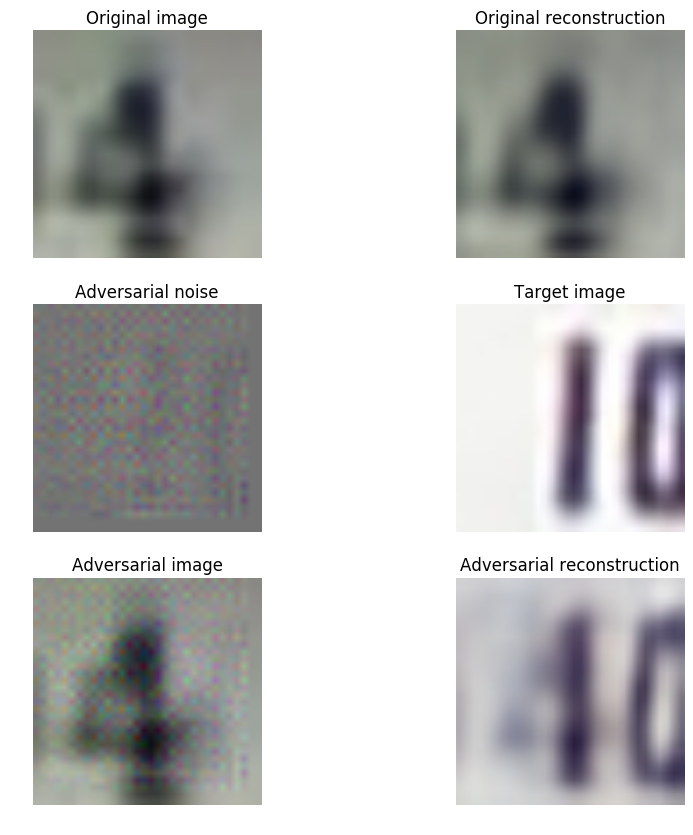

4820 13032


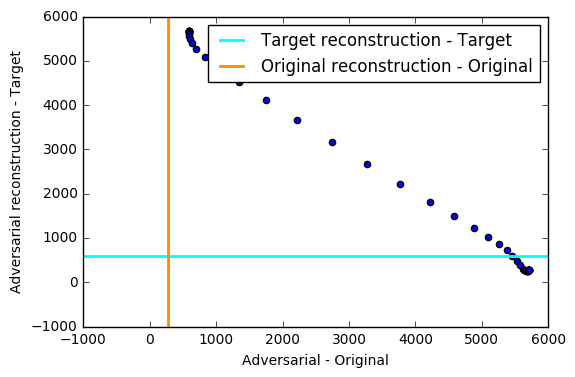

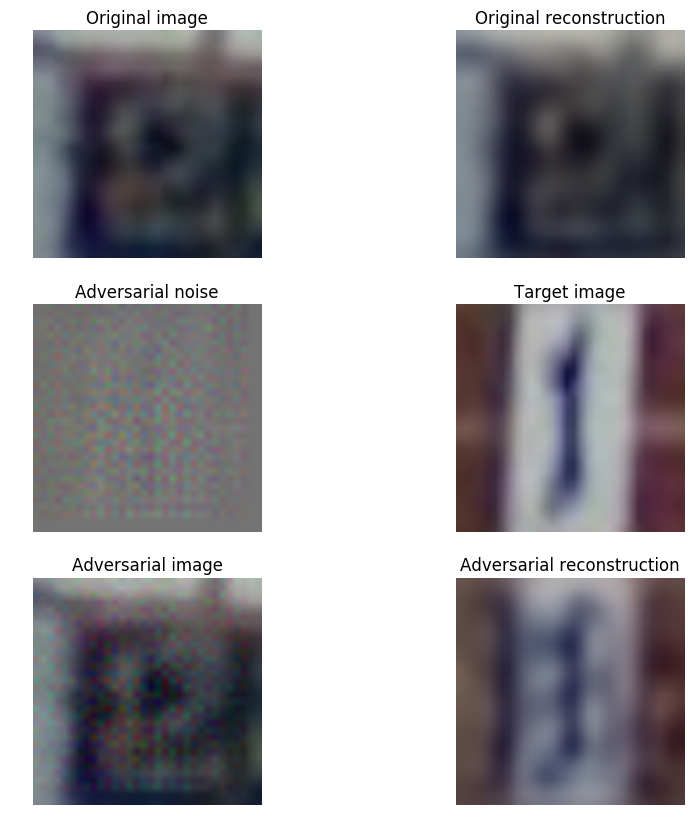

23895 9757


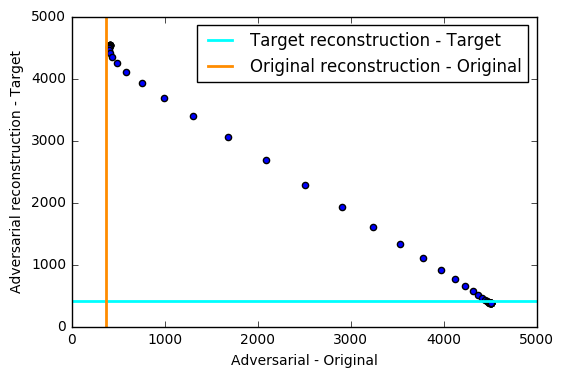

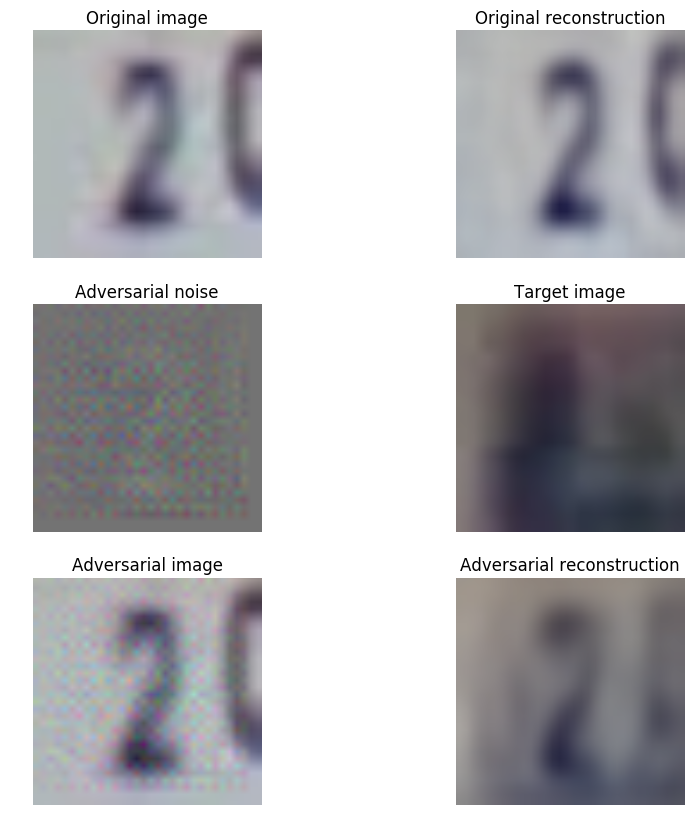

9124 14523


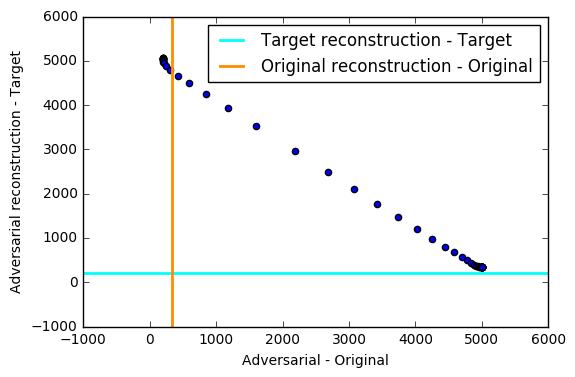

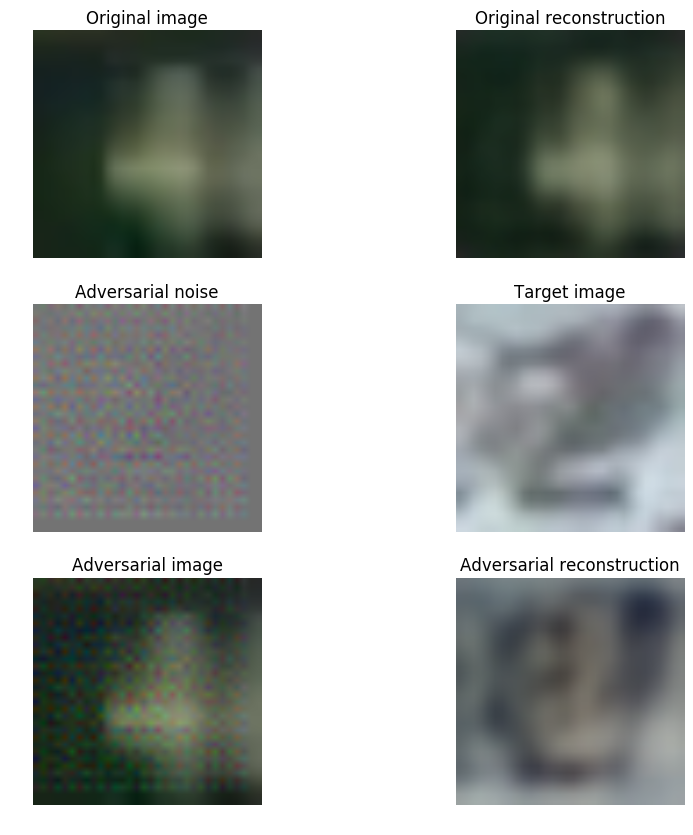

6185 23474


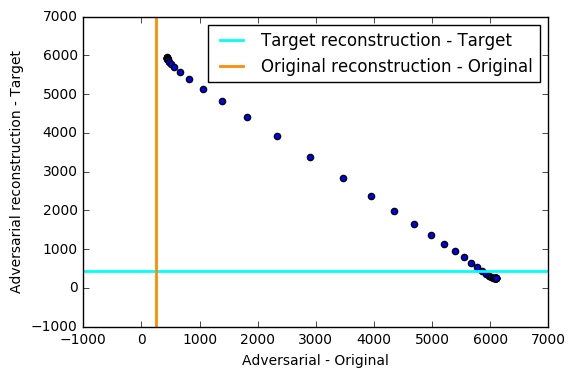

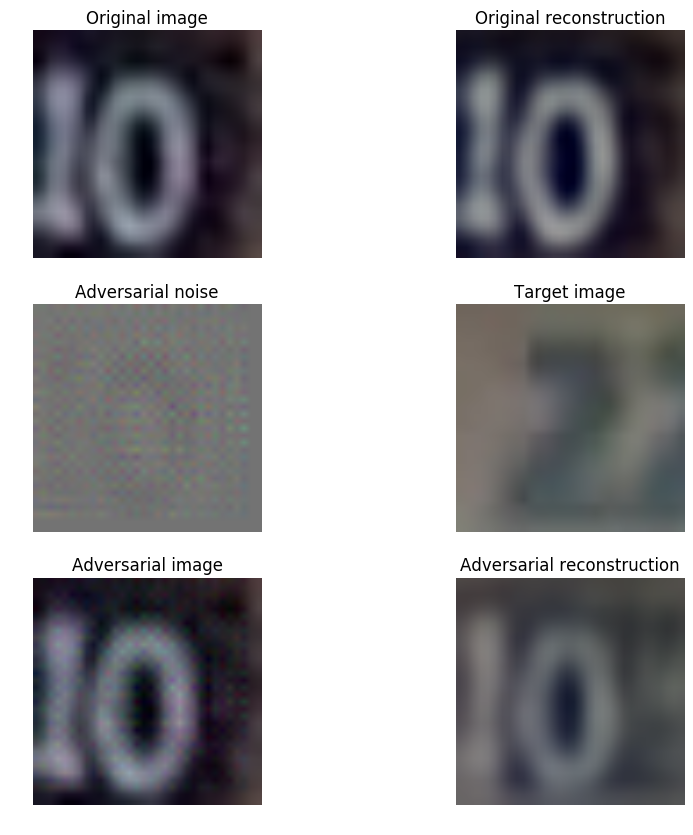

15119 13900


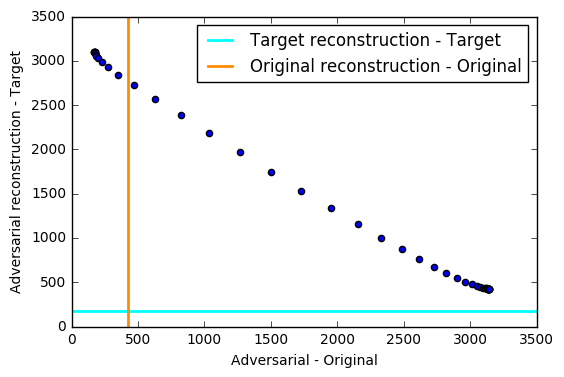

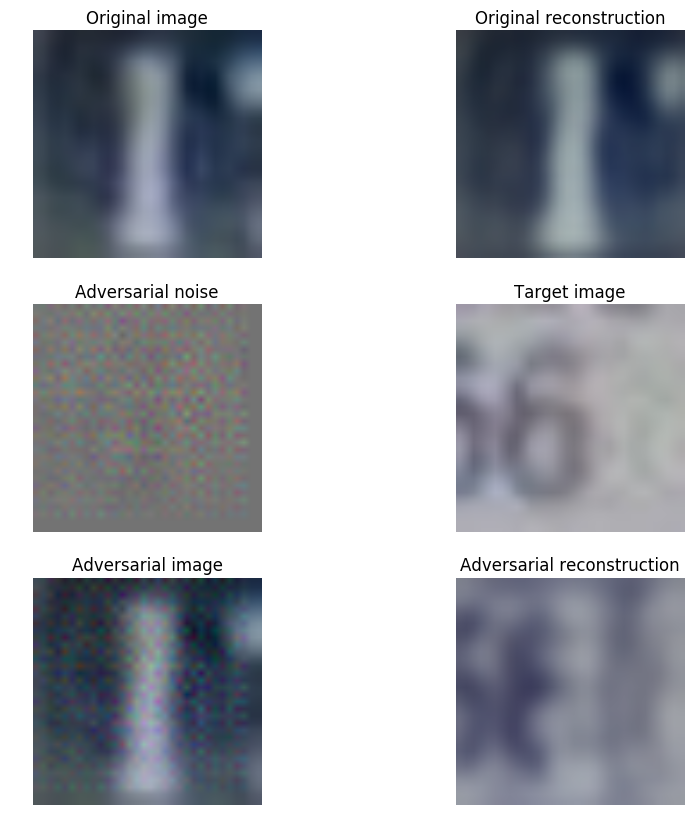

12652 17368


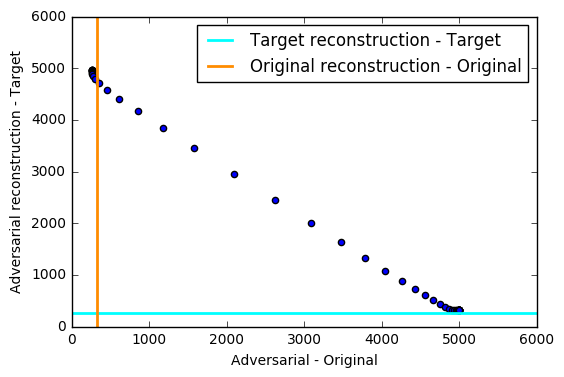

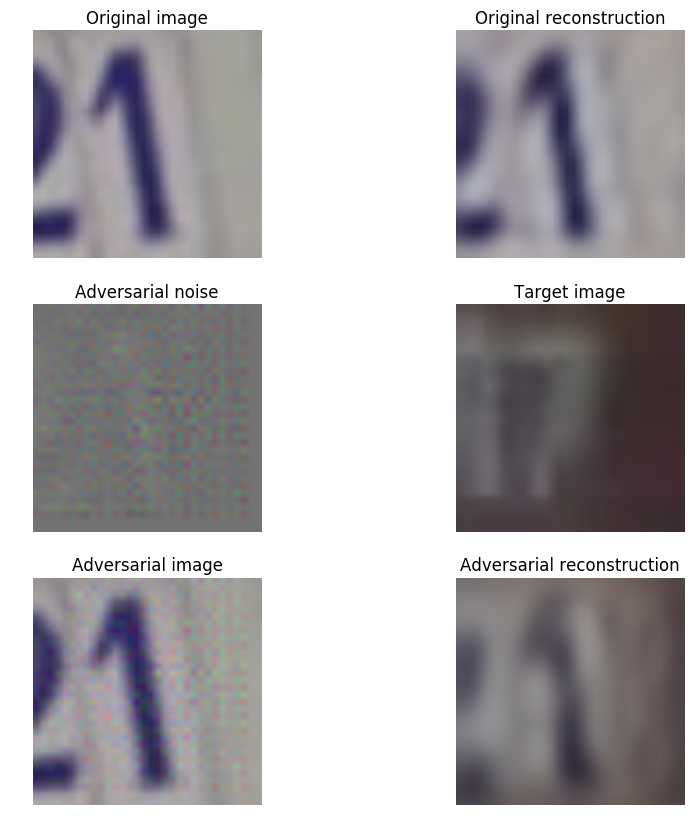

24331 3722


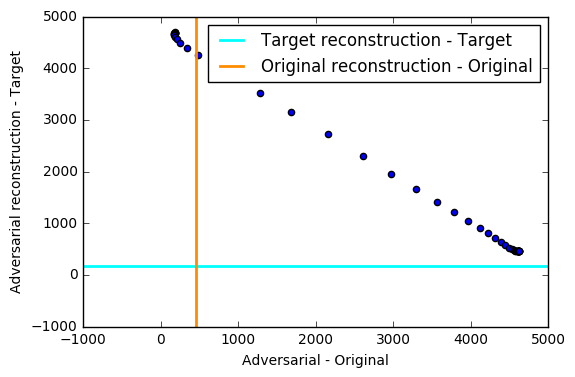

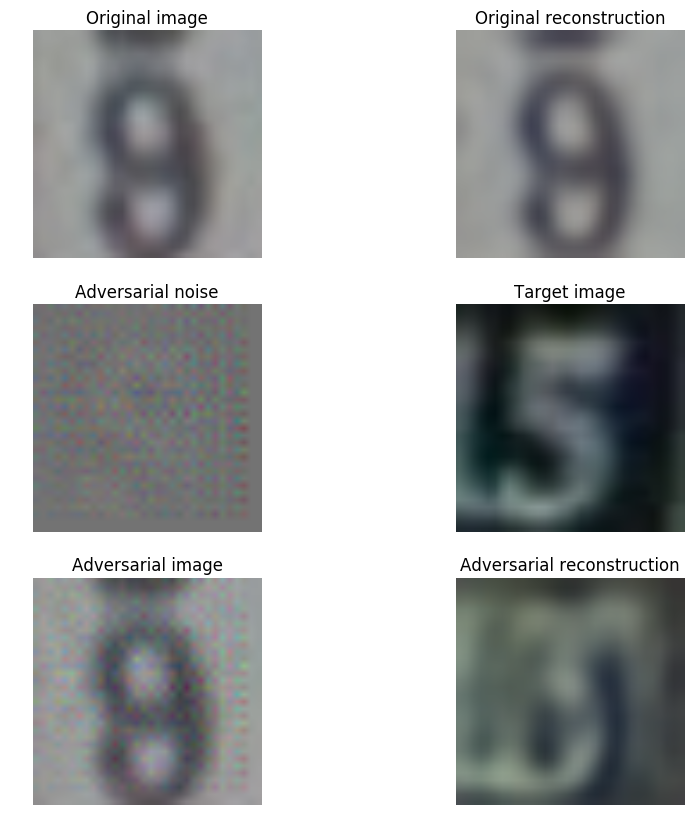

934 25387


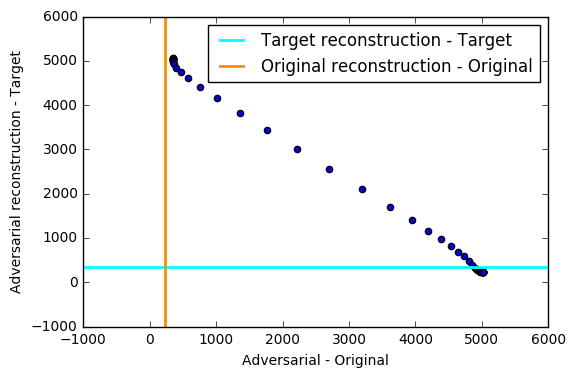

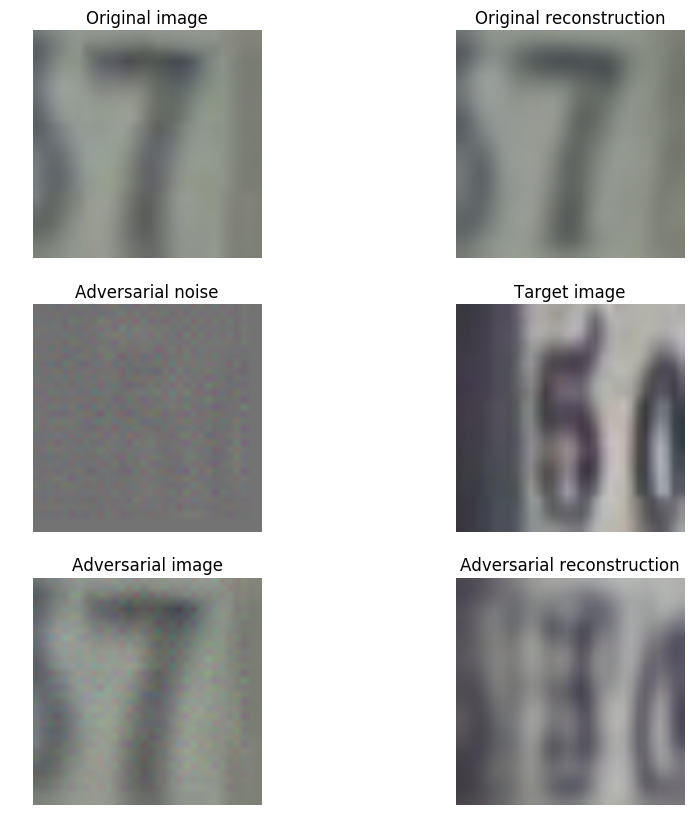

19272 18393


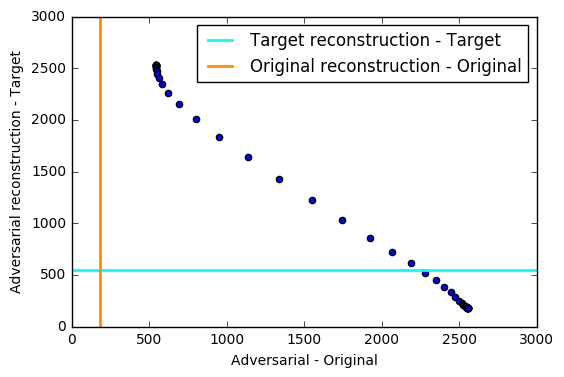

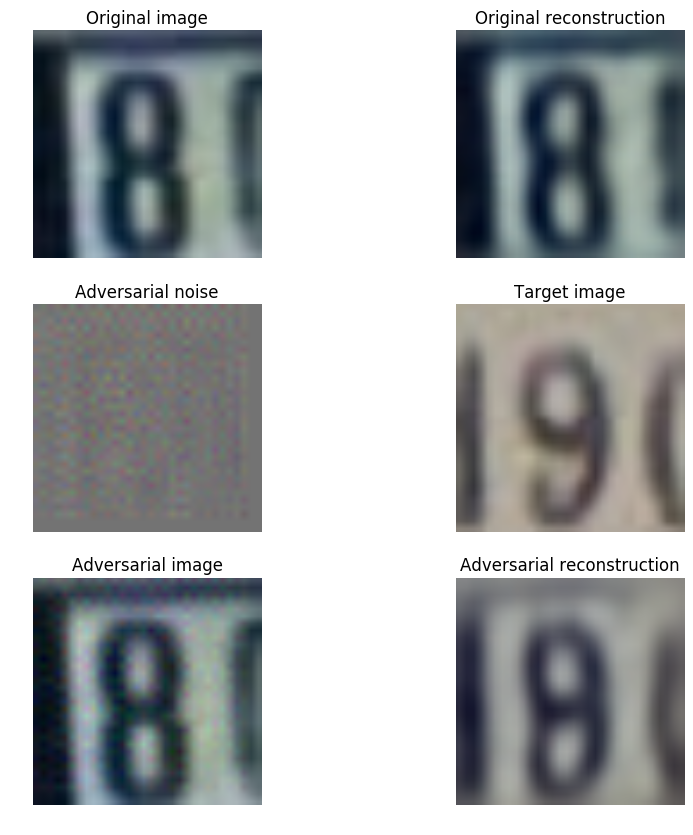

16664 2545


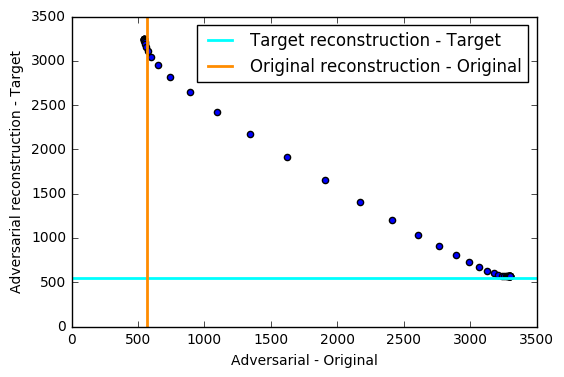

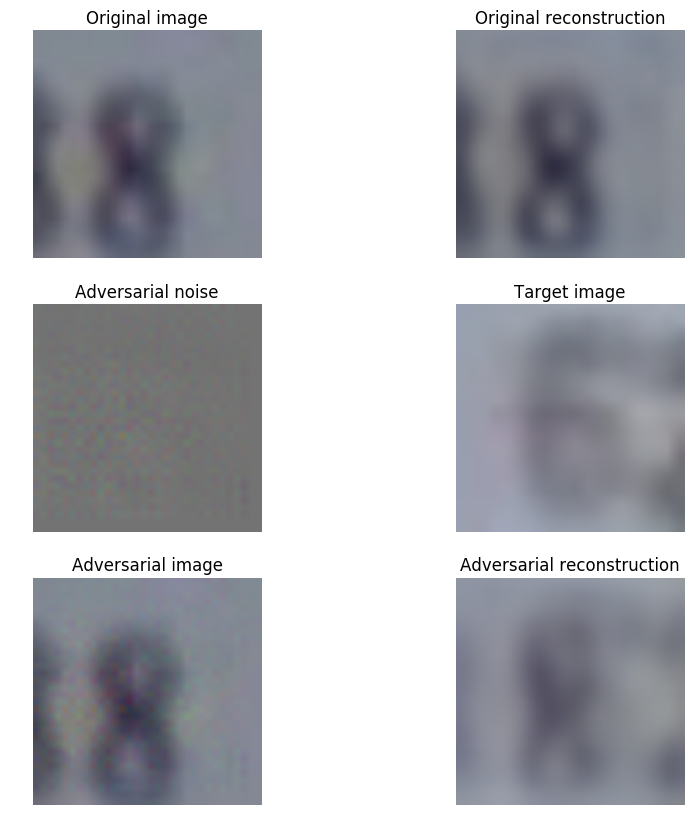

15316 3594


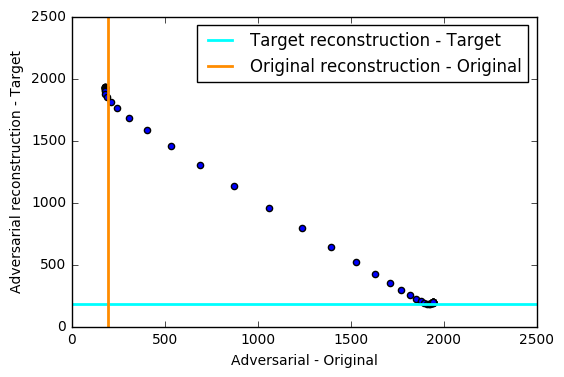

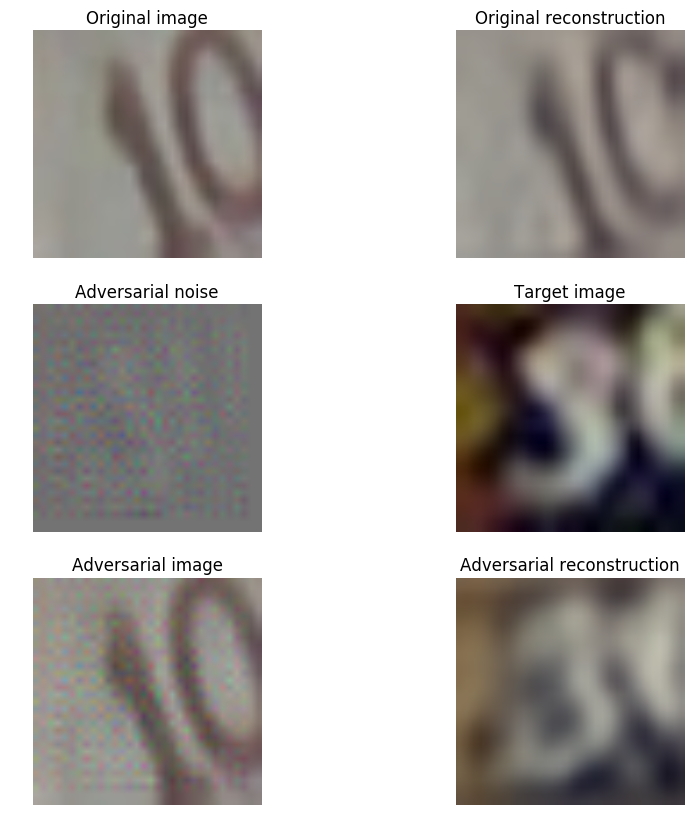

18586 16716


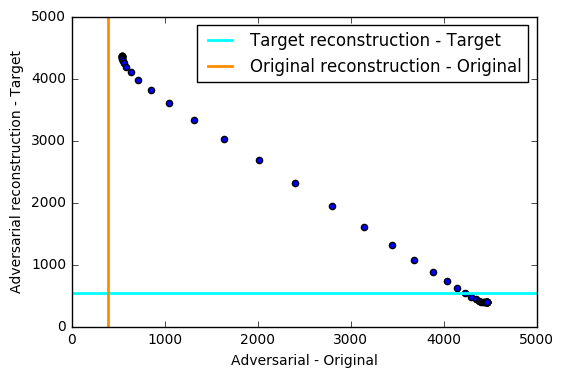

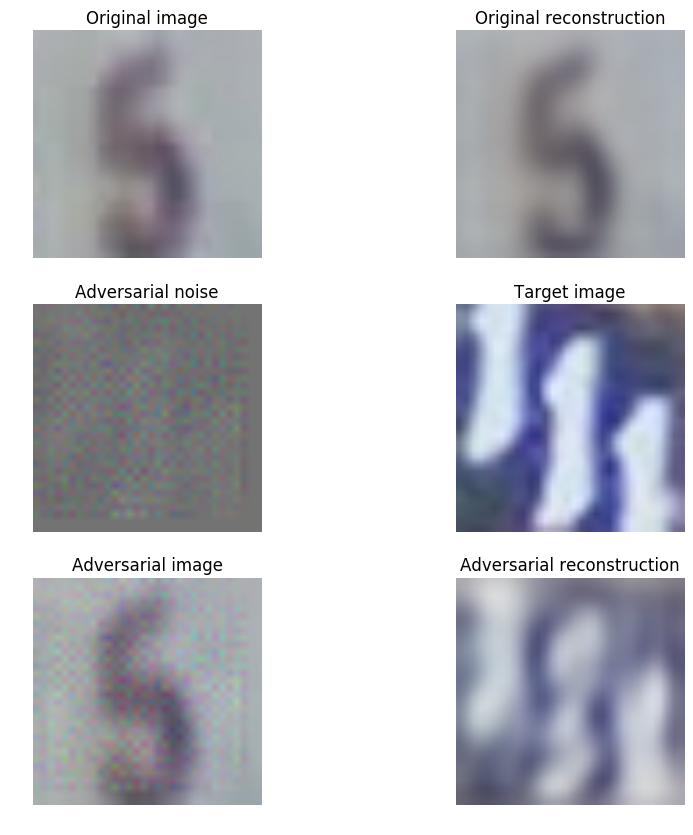

3696 11024


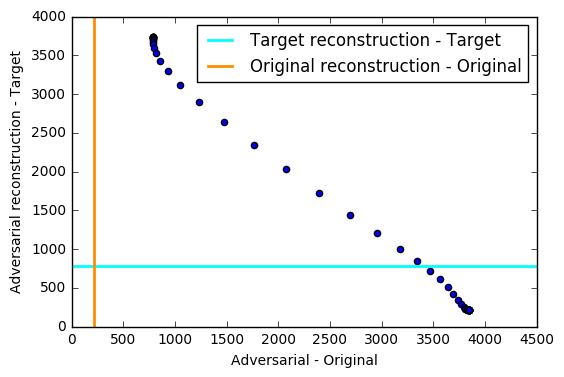

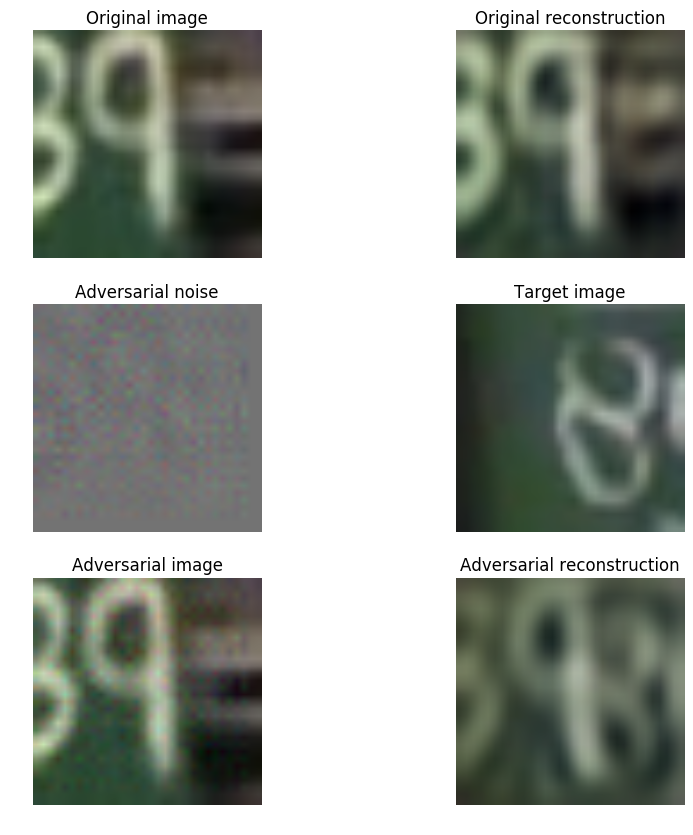

11786 19421


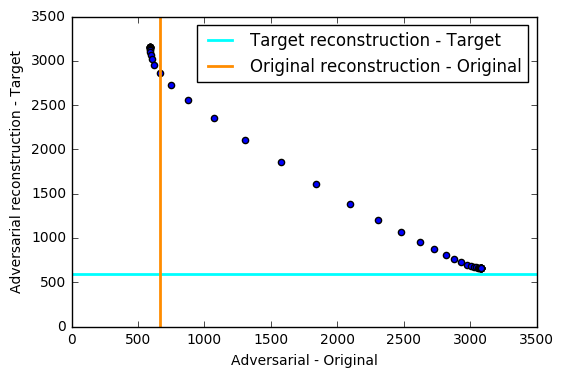

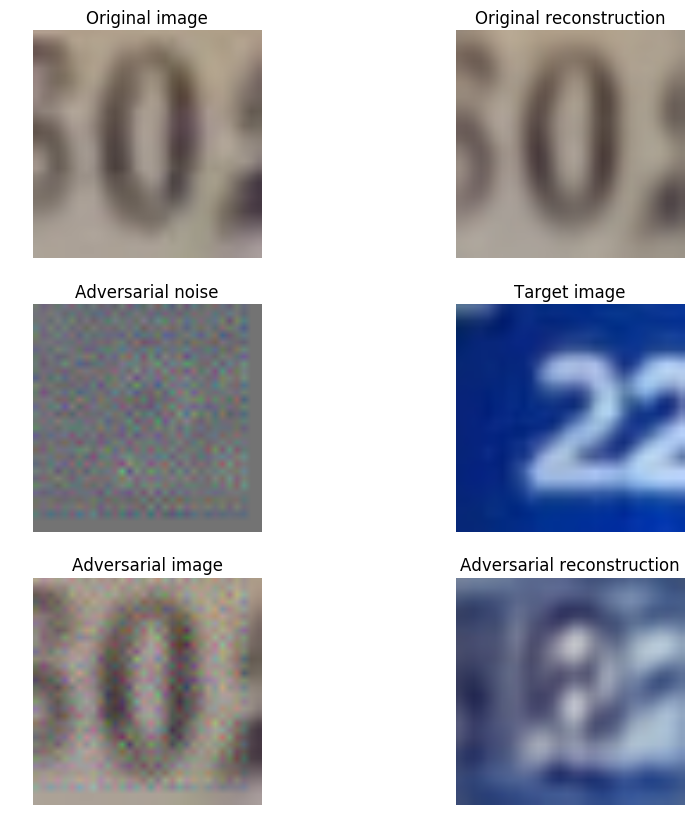

23215 20512


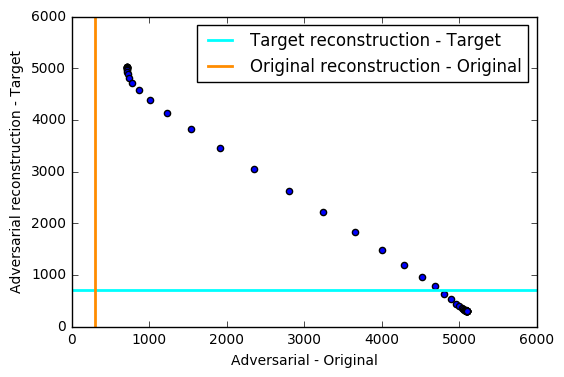

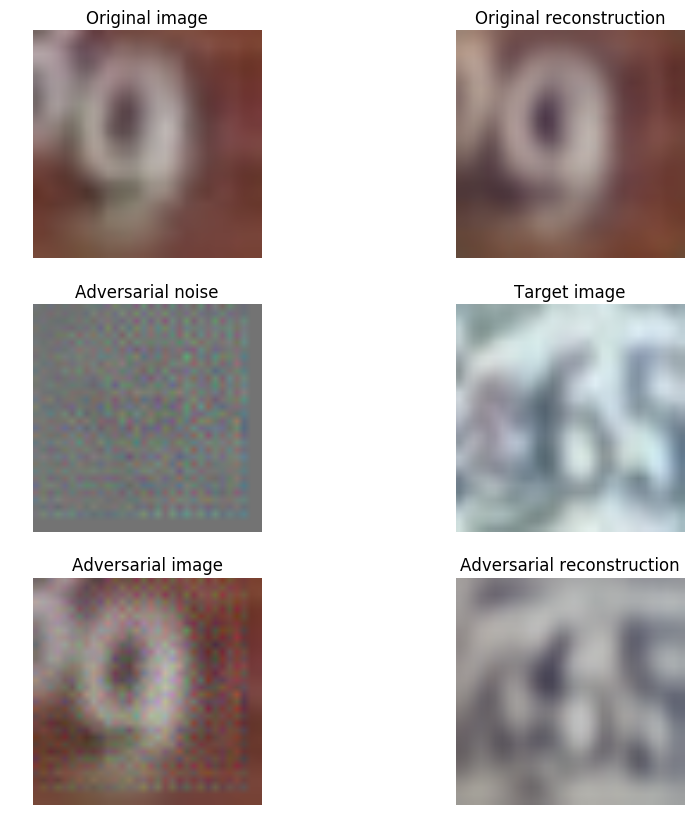

11712 3437


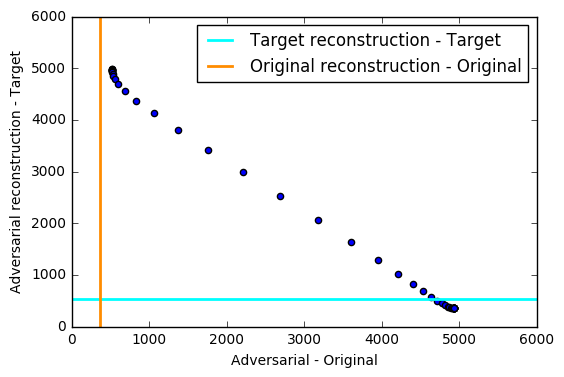

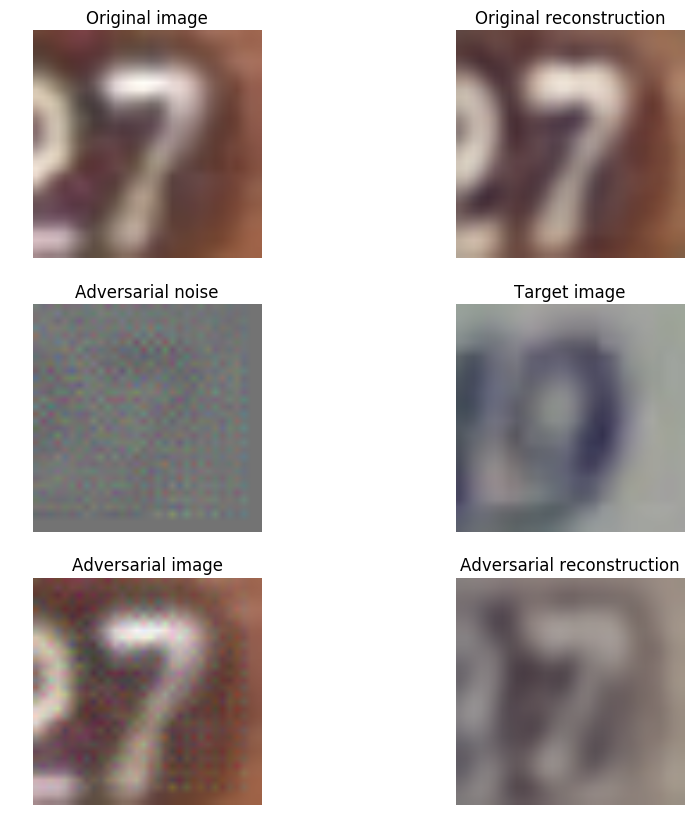

4055 20603


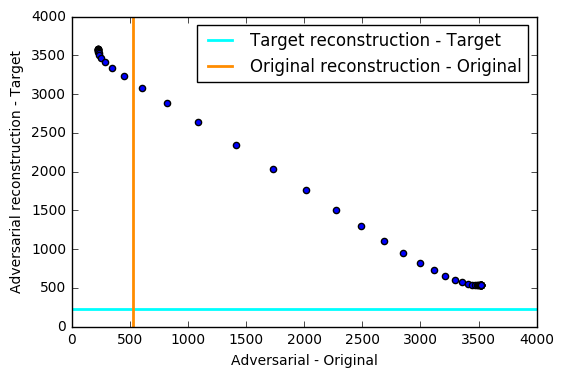

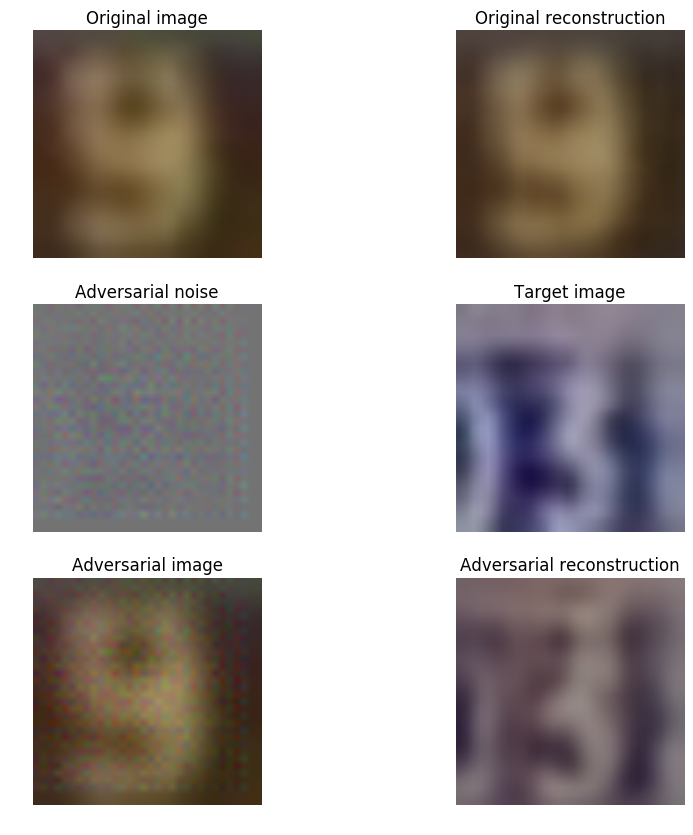

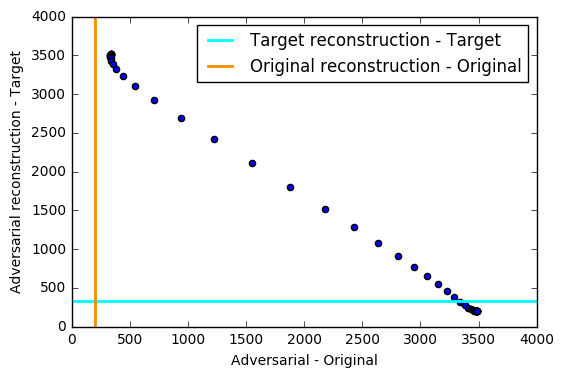

In [13]:
n = 25

xs = []
ys = []

for i in range(n):
    x, y = orig_adv_dist(plot = True)
    xs.append(x)
    ys.append(y)


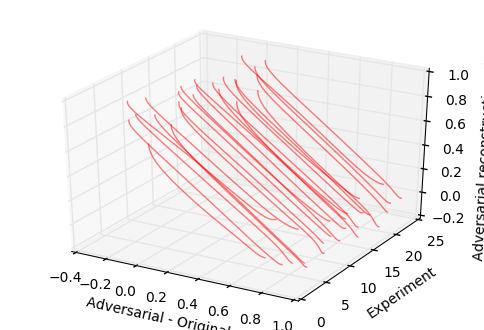

In [14]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for i in range(n):
    ax.plot(xs[i], [i]*len(xs[i]), ys[i], color = 'r', alpha = 0.5)

ax.set_xlabel('Adversarial - Original')
ax.set_ylabel('Experiment')
ax.set_zlabel('Adversarial reconstruction - Target')
plt.show()